# Homework  <3>
# Influenza H1N1 2009 Pandemic in Sweden

In [1]:
import numpy as np 
import networkx as nx
import matplotlib.pyplot as plt 
from scipy.sparse import csr_matrix
from tqdm import tqdm
from sklearn.metrics import mean_squared_error
import itertools

np.random.seed(1)

## Problem 1

### >> Problem 1.1:

You should simulate an epidemic on a symmetric $k$-regular graph $(G = (V, E))$ with $(|V| = 500)$ nodes and $(k = 4)$. See Figure 1 for an example with $(n = 8)$ nodes. Let $(beta = 0.3)$ and $(p = 0.7)$. With one week being one unit of time, simulate the epidemic for $15$ weeks. You can choose an initial configuration with 10 infected nodes selected at random from the node set $(V)$, or make a different choice of initial configuration.

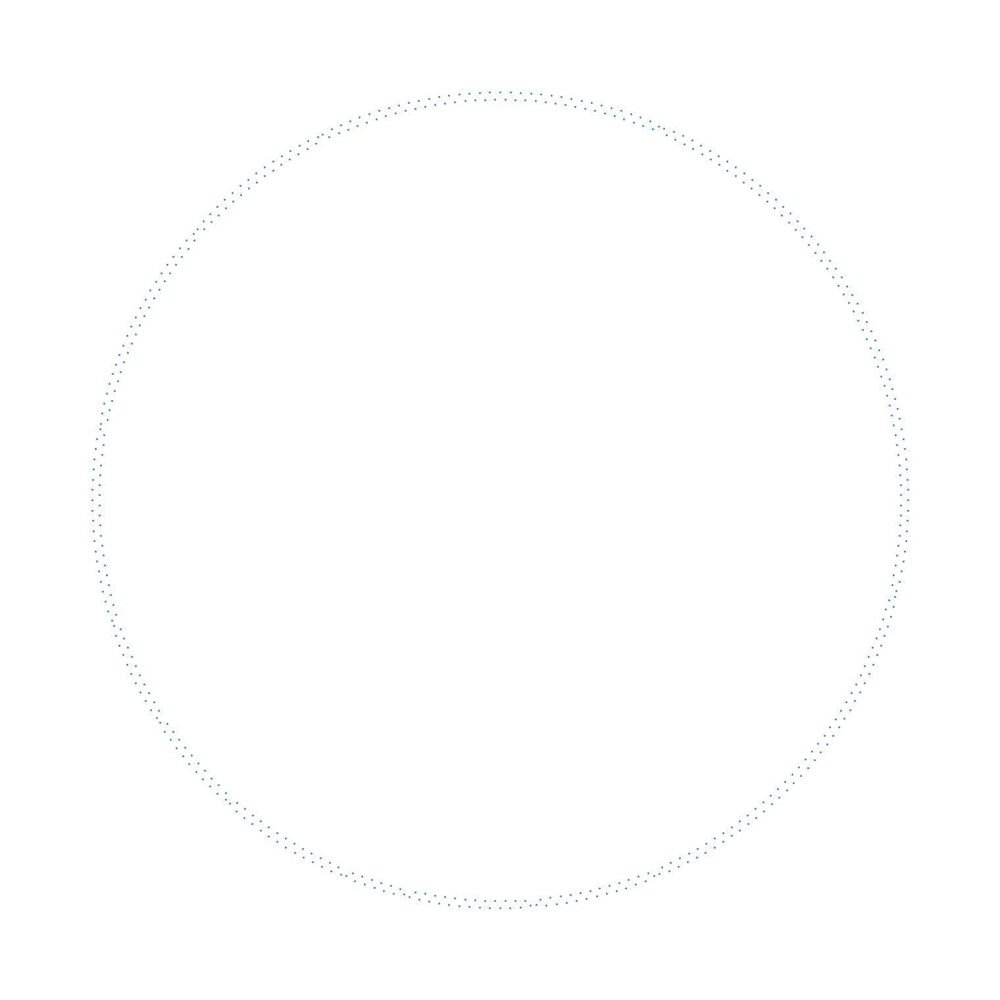

In [2]:
def generate_k_regular_graph(nodes_num=500, k=4):
    starting_node = np.zeros(nodes_num)
    starting_node[[1, 2, -1, -2]] = 1
    w_matrix = np.array([np.roll(starting_node, shift) for shift in range(nodes_num)]).astype(int)
    return w_matrix

def graph_visualize(w_matrix):
    adj_matrix = w_matrix.toarray()
    G = nx.Graph(adj_matrix)

    plt.figure(figsize=(15, 15))
    nx.draw_kamada_kawai(G, node_size=4, linewidths=0.01, width=0.01)
    plt.savefig('graph1.1.svg', format='svg')
    plt.show()

Y = generate_k_regular_graph()
Y = csr_matrix(Y)
graph_visualize(Y)

In [3]:
S = 0
I = 1
R = 2

# Determines if an infected node recovers this step based on recovery rate, returning 1 (infected) or 2 (recovered).
def decide_recovery(recovery_rate):
    
    return np.random.choice([I, R], p=[1 - recovery_rate, recovery_rate])

In [4]:
# Simulates epidemic spread on a network, returning statistics and new infections over time.
def epidemic_simulation(W, nodes_num=500, beta=0.3, ro=0.7, initial_infected_count=10, weeks=15, simulations_count=100):
    whole_simulation_states = []
    all_simulation_new_infections = []
    
    for _ in tqdm(range(simulations_count)):
        node_states = np.zeros(nodes_num, dtype=np.int8)

        initially_infected = np.random.choice(range(nodes_num), size=initial_infected_count, replace=False)
        node_states[initially_infected] = I
        
        temp_node_states = np.copy(node_states)
        week_states = [(nodes_num - initial_infected_count, initial_infected_count, 0)]
        week_new_infections = [0]

        for _ in range(weeks):
            new_infections = 0  
            
            for node in range(nodes_num):
                # Determine the infection probability using the infection rate (beta) and the count of infected neighbors.
                if node_states[node] == S:
                    infected_neighbors = np.sum(W[node] * (node_states == I))
                    infection_prob = 1 - (1 - beta) ** infected_neighbors
                    temp_node_states[node] = np.random.choice([S, I], p=[1 - infection_prob, infection_prob])
                    new_infections += temp_node_states[node] == I

                elif node_states[node] == I:
                    temp_node_states[node] = decide_recovery(ro)

            current_week_state = np.bincount(temp_node_states, minlength=3)
            week_states.append(current_week_state)
            node_states = temp_node_states
            week_new_infections.append(new_infections)

        whole_simulation_states.append(week_states)
        all_simulation_new_infections.append(week_new_infections)

    return np.array(whole_simulation_states), np.array(all_simulation_new_infections)

100%|██████████| 100/100 [00:38<00:00,  2.58it/s]


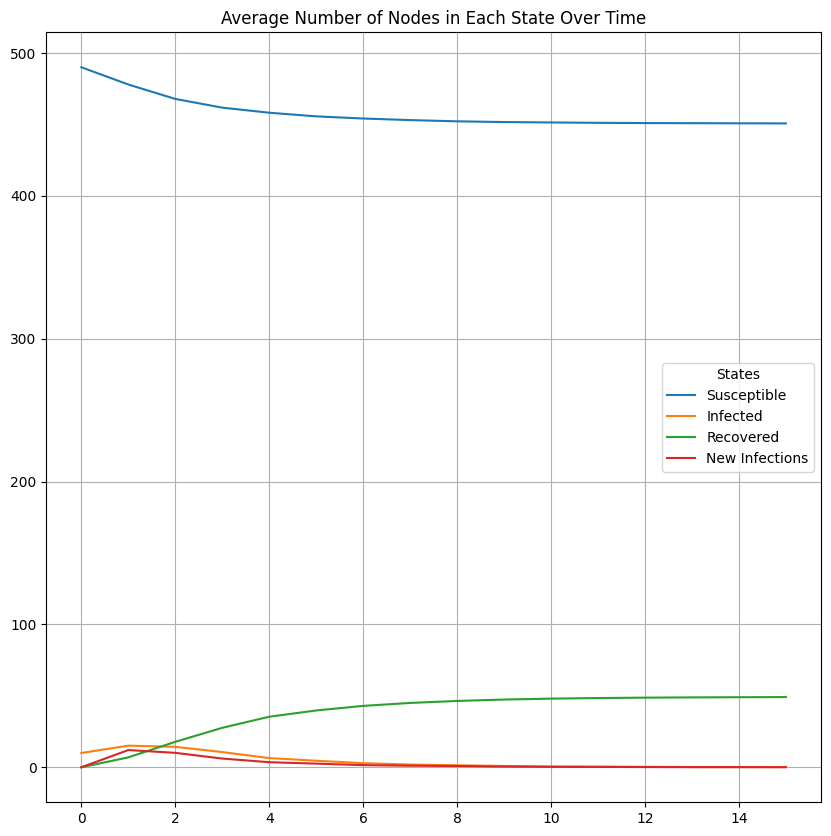

In [5]:
def plot_results(simulation_results, new_infection_counts):
    plt.figure(figsize=(10, 10))
    plt.title("Average Number of Nodes in Each State Over Time")
    plt.grid()
    time_range = range(15 + 1)       # Number of weeks + 1.
    plt.plot(time_range, np.mean(simulation_results, axis=0)[:, S], label="Susceptible")
    plt.plot(time_range, np.mean(simulation_results, axis=0)[:, I], label="Infected")
    plt.plot(time_range, np.mean(simulation_results, axis=0)[:, R], label="Recovered")
    plt.plot(time_range, np.mean(new_infection_counts, axis=0), label='New Infections')
    plt.legend(title='States')
    plt.savefig('plot1.1.svg', format='svg')
    plt.show()


simulation_results, new_infection_counts = epidemic_simulation(Y)

plot_results(simulation_results, new_infection_counts)


### >> Problem 1.2:

Your goal is to, by using preferential attachment, generate a random graph of a large size (at least 900 nodes) with average degree $k \in \mathbb{Z}^+$. Let the initial graph $G_1 = (V_1, \mathcal{E}_1)$ be a complete graph with $|V_1| = k_0 = k + 1$ nodes.


In [6]:
# Generates a preferential attachment graph with average degree k and node count node_num, returning a NetworkX graph.
def preferential_attachment_graph_creation(k, node_num):
    G = nx.complete_graph(k + 1)

    for node in range(k + 1, node_num):
        c = int(k / 2) if node % 2 == 0 else int(np.floor(k / 2))
        degrees = np.array([deg for _, deg in G.degree()]) 
        degrees = degrees / degrees.sum()
        chosen_neighbors = np.random.choice(list(G.nodes), p=degrees, size=c, replace=False)
        
        G.add_node(node)
        for neighbor in chosen_neighbors:
            G.add_edge(node, neighbor)

    return G

Mean Degree : 4.0
From richer node to poorer node : [59, 57, 53, 51, 40, 34, 34, 32, 30, 25, 23, 23, 23, 22, 21, 19, 19, 19, 19, 19, 18, 18, 17, 17, 16, 16, 16, 15, 15, 15, 14, 14, 14, 13, 13, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 9, 9, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3

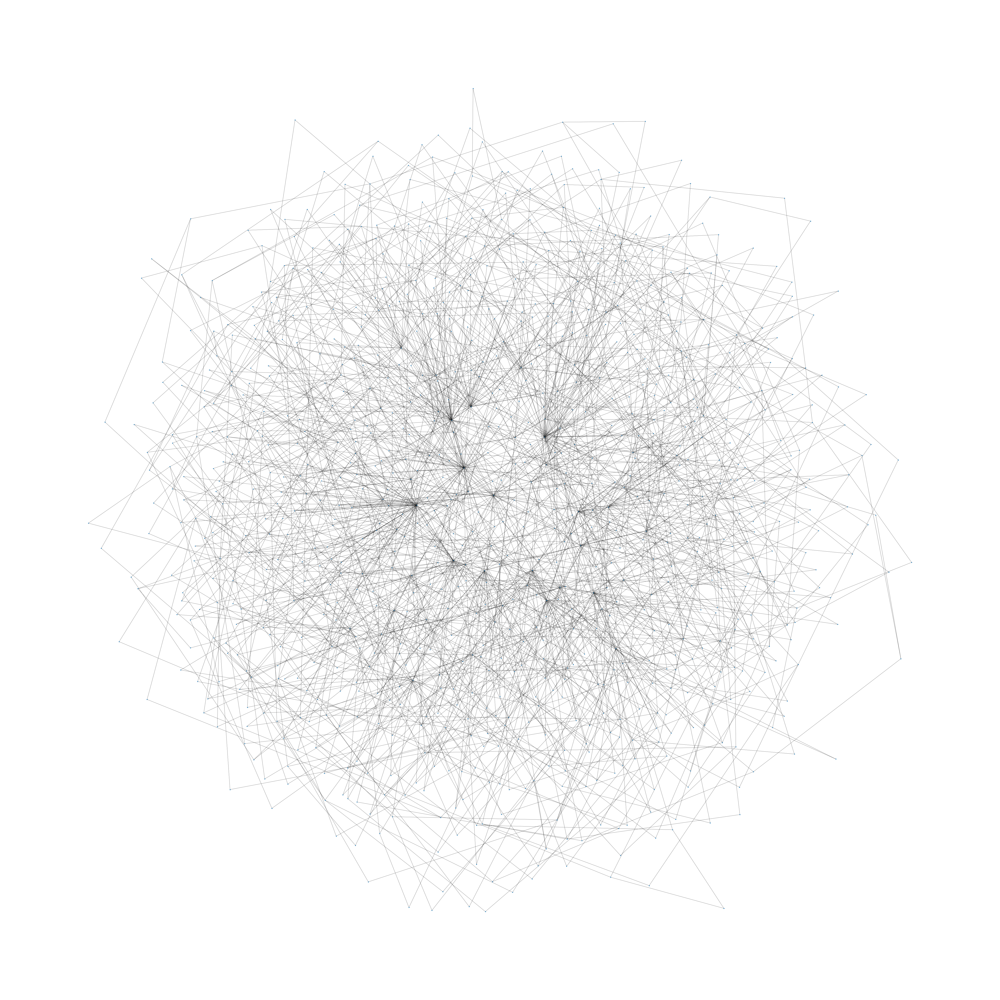

In [7]:
def visualize_graph(G):
    plt.figure(figsize=(50, 50))
    nx.draw_kamada_kawai(G, node_size=10, linewidths=0.1, width=0.4)
    plt.savefig('graph1.2.svg', format='svg')
    plt.show()

preferential_graph = preferential_attachment_graph_creation(k=4, node_num=900)

mean_degree = sum(dict(preferential_graph.degree()).values()) / len(preferential_graph.nodes())
print(f'Mean Degree : {mean_degree}')
print(f'From richer node to poorer node : {sorted(list(dict(preferential_graph.degree()).values()),reverse=True)}')

visualize_graph(preferential_graph)

### Problem 2 : Epidemic without vaccination

100%|██████████| 100/100 [00:17<00:00,  5.57it/s]


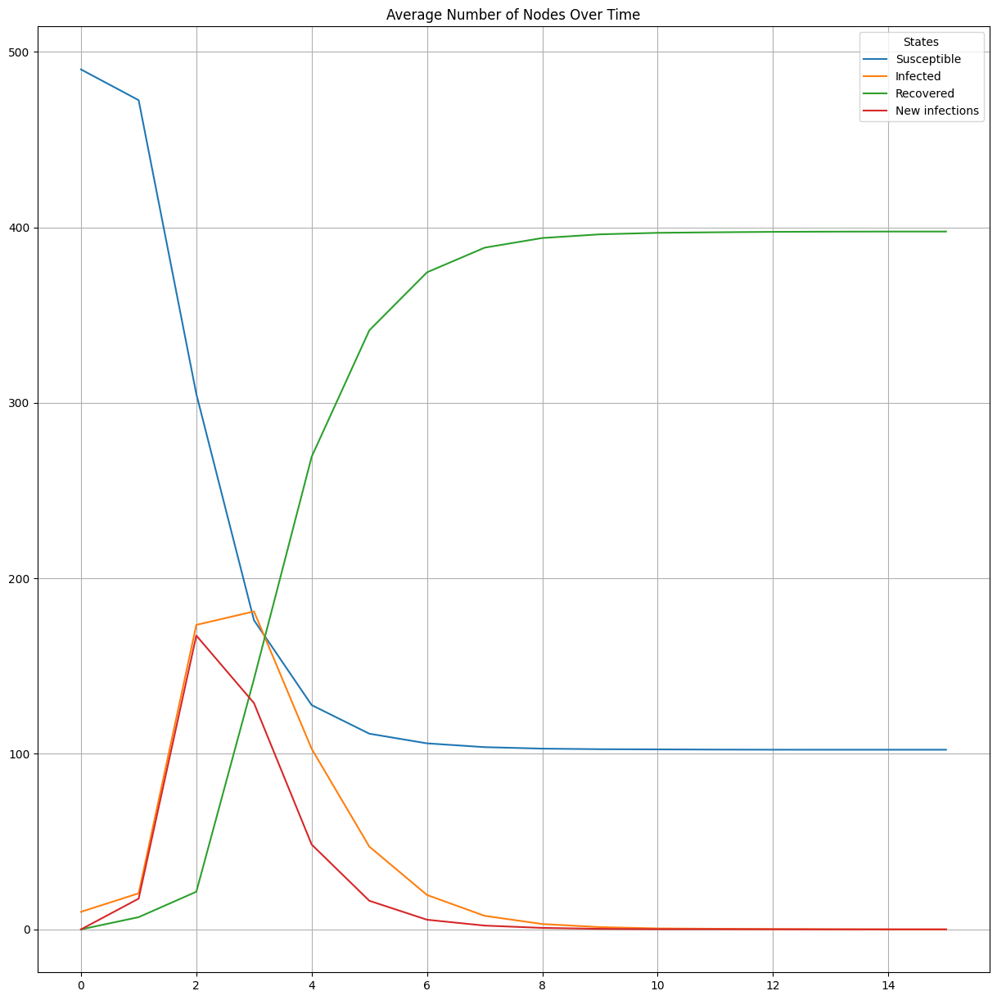

In [8]:
def visualization(simulation_states, new_infection_counts):
    plt.figure(figsize=(15, 15))
    plt.title("Average Number of Nodes Over Time")
    plt.grid()
    plt.plot(range(16), np.mean(simulation_states, axis=0)[:, S], label="Susceptible")
    plt.plot(range(16), np.mean(simulation_states, axis=0)[:, I], label="Infected")
    plt.plot(range(16), np.mean(simulation_states, axis=0)[:, R], label="Recovered")
    plt.plot(range(16), np.mean(new_infection_counts, axis = 0), label='New infections')
    plt.legend(title='States', loc='upper right')
    plt.savefig('plot2.svg', format='svg')
    plt.show()

G = preferential_attachment_graph_creation(k=6, node_num=500)
Y = nx.adjacency_matrix(G).astype(int)
Y = csr_matrix(Y)
simulation_states, new_infection_counts = epidemic_simulation(Y, nodes_num=len(G), initial_infected_count=10, beta=0.3, ro=0.7, simulations_count=100, weeks=15)
visualization(simulation_states, new_infection_counts)

### Problem 3 - Simulate a pandemic with vaccination

In [9]:
def vaccinated_nodes_selection(adj_matrix, vaccination_status, vaccination_percent):
    unvaccinated_nodes = np.argwhere(vaccination_status == 0).flatten()
    num_to_vaccinate = int(len(vaccination_status) * vaccination_percent / 100)
    chosen_for_vaccination = np.random.choice(unvaccinated_nodes, size=num_to_vaccinate, replace=False)
    return chosen_for_vaccination

def calculate_infection_probability_with_vaccination(node, infection_rate, neighbors, current_state, vaccination_status):
    unvaccinated_neighbors = neighbors[vaccination_status[neighbors] == 0]
    infected_neighbors = np.sum(current_state[unvaccinated_neighbors] == I)
    infection_probability = 1 - (1 - infection_rate) ** infected_neighbors
    return np.random.choice([S, I], p=[1 - infection_probability, infection_probability])

In [10]:
# Simulates an epidemic with vaccination strategy
def simulatation_epidemic_with_vaccination(num_edges, nodes_num, beta, ro, initial_infected_count, simulations_count, weeks, vaccination_schedule=None, reference_vaccination=None, progress_bar = 1):
  
    all_simulations_states = []
    all_simulations_new_infections = []

    vaccine_schedule = vaccination_schedule
    reference_vac = reference_vaccination

    preferential_graph = preferential_attachment_graph_creation(k=num_edges, node_num=nodes_num)
    W = nx.adjacency_matrix(preferential_graph)
    W = csr_matrix(W)
    
    simulations = tqdm(range(simulations_count)) if progress_bar else range(simulations_count)
    for simulation in simulations:
        simulation_nodes_states = np.zeros(nodes_num, dtype=np.int8)
        initially_infected = np.random.choice(range(nodes_num), size=initial_infected_count, replace=False)
        simulation_nodes_states[initially_infected] = I

        simulation_weeks_states = []
        simulation_weeks_states.append([nodes_num - initial_infected_count, 0, initial_infected_count, 0, 0, 0])
        simulation_vaccinated_states = np.zeros(nodes_num, dtype=np.int8)
        
        temp_nodes_states = np.copy(simulation_nodes_states)

        simulation_weeks_new_infections = []
        simulation_weeks_new_infections.append(0)

        for week in range(weeks):
            week_new_infections = 0
            if week == 0:  
                vaccination_amount = max(0, vaccine_schedule[week] - 0)
            else:
                vaccination_amount = max(0, vaccine_schedule[week] - vaccine_schedule[week - 1])
            if vaccination_amount > 0:
                vaccinated_nodes = vaccinated_nodes_selection(W, simulation_vaccinated_states, vaccination_amount)
                simulation_vaccinated_states[vaccinated_nodes] = 1 ## Mitoonim bezanim 

            for node in range(nodes_num):
                if simulation_nodes_states[node] == S and simulation_vaccinated_states[node] != 1:
                    temp_nodes_states[node] = calculate_infection_probability_with_vaccination(node, beta, W[node].indices, simulation_nodes_states, simulation_vaccinated_states)
                    week_new_infections += temp_nodes_states[node] == I

                elif simulation_nodes_states[node] == I:
                    temp_nodes_states[node] = decide_recovery(ro)

            week_state = (
                np.sum((temp_nodes_states == S) & (simulation_vaccinated_states == 0)),  # Susceptible, Unvaccinated
                np.sum((temp_nodes_states == S) & (simulation_vaccinated_states == 1)),  # Susceptible, Vaccinated
                np.sum(temp_nodes_states == I),                                          # Infected
                np.sum(temp_nodes_states == R),                                          # Recovered
                np.sum(simulation_vaccinated_states == 1),                               # Vaccinated
                vaccination_amount                                                       # New Vaccinations
            )

            simulation_weeks_states.append(week_state)
            simulation_nodes_states = temp_nodes_states.copy()
            simulation_weeks_new_infections.append(week_new_infections)
            

        all_simulations_states.append(simulation_weeks_states)
        all_simulations_new_infections.append(simulation_weeks_new_infections)

    mean_infections_over_time = np.mean(all_simulations_new_infections, axis=0)
    
    if reference_vac is not None:
        root_mean_sq_error = mean_squared_error(mean_infections_over_time, reference_vac, squared=False)
    else:
        root_mean_sq_error = None
    return all_simulations_states, all_simulations_new_infections, mean_infections_over_time, root_mean_sq_error

In [11]:
# Establishing a detailed vaccination timetable
vaccine_timeline = [0, 5, 15, 25, 35, 45, 55, 60, 60, 60, 60, 60, 60, 60, 60]

simulation_states_with_vaccine, new_infections_with_vaccine, mean_infections, root_mean_square_error = simulatation_epidemic_with_vaccination(num_edges=6, nodes_num=500, initial_infected_count=10, beta=0.3, ro=0.7, simulations_count=100, weeks=15, vaccination_schedule=vaccine_timeline)

100%|██████████| 100/100 [00:16<00:00,  6.20it/s]


[[[490, 0, 10, 0, 0, 0], (474, 0, 19, 7, 0, 0), (407, 25, 48, 20, 25, 5), (290, 66, 93, 51, 75, 10), (194, 97, 94, 115, 125, 10), (135, 124, 53, 188, 175, 10), (94, 150, 34, 222, 225, 10), (75, 167, 11, 247, 275, 10), (66, 176, 4, 254, 300, 5), (66, 176, 1, 257, 300, 0), (66, 176, 0, 258, 300, 0), (66, 176, 0, 258, 300, 0), (66, 176, 0, 258, 300, 0), (66, 176, 0, 258, 300, 0), (66, 176, 0, 258, 300, 0), (66, 176, 0, 258, 300, 0)], [[490, 0, 10, 0, 0, 0], (476, 0, 18, 6, 0, 0), (389, 25, 67, 19, 25, 5), (270, 70, 94, 66, 75, 10), (183, 95, 97, 125, 125, 10), (130, 118, 59, 193, 175, 10), (95, 139, 30, 236, 225, 10), (77, 155, 11, 257, 275, 10), (72, 160, 5, 263, 300, 5), (71, 160, 3, 266, 300, 0), (71, 160, 0, 269, 300, 0), (71, 160, 0, 269, 300, 0), (71, 160, 0, 269, 300, 0), (71, 160, 0, 269, 300, 0), (71, 160, 0, 269, 300, 0), (71, 160, 0, 269, 300, 0)], [[490, 0, 10, 0, 0, 0], (472, 0, 21, 7, 0, 0), (424, 23, 31, 22, 25, 5), (327, 69, 62, 42, 75, 10), (234, 106, 77, 83, 125, 10), (1

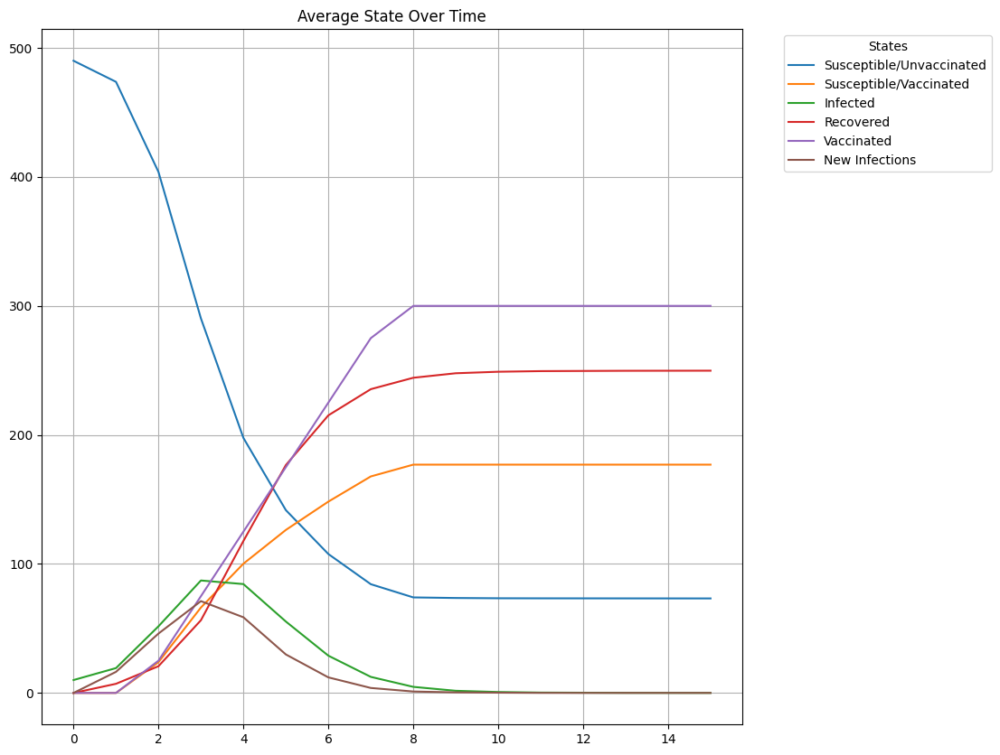

<Figure size 640x480 with 0 Axes>

In [12]:
print(simulation_states_with_vaccine)
plt.figure(figsize=(10, 10))
plt.title("Average State Over Time")
plt.grid()

plt.plot(np.mean(simulation_states_with_vaccine, axis=0)[:, 0], label="Susceptible/Unvaccinated") # Susceptible, Unvaccinated
plt.plot(np.mean(simulation_states_with_vaccine, axis=0)[:, 1], label="Susceptible/Vaccinated") # Susceptible, Vaccinated
plt.plot(np.mean(simulation_states_with_vaccine, axis=0)[:, 2], label="Infected") # Infected
plt.plot(np.mean(simulation_states_with_vaccine, axis=0)[:, 3], label="Recovered") # Recovered
plt.plot(np.mean(simulation_states_with_vaccine, axis=0)[:, 4], label="Vaccinated") # Vaccinated
plt.plot(np.mean(new_infections_with_vaccine, axis=0), label="New Infections") # New Vaccinations
plt.legend(title='States', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
plt.savefig('plot3.svg', format='svg')

### Problem 4 - The H1N1 pandemic in Sweden 2009

In [13]:
# Optimizes epidemic model parameters (initial_num_edges, initial_beta, initial_ro) by gradient descent, returning best parameters and simulation state.
def parameters_optimization(initial_num_edges=10, initial_beta=0.3, initial_ro=0.6, delta_k=2, delta_beta=0.1, delta_ro=0.1):
    
    best_rmse = float('inf')
    precision_increase_step = 0
    precision_multiplier = 0.5
    threshold = 1e-5
    update_counter = 0
    reference_vaccination = [1, 1, 3,5, 9, 17, 32, 32, 17, 5, 2, 1, 0, 0, 0, 0]
    
    current_k = initial_num_edges
    current_beta = initial_beta
    current_ro = initial_ro

    while True:
        best_local_rmse = float('inf')
        has_changed = False
        print(f"Starting Parameters with k={current_k}, beta={current_beta}, ro={current_ro}")

        # Generate the cartesian product of all parameter sets to be tested
        param_ranges = [
            {max(0, current_beta - (precision_multiplier**precision_increase_step) * delta_beta), 
             current_beta, 
             min(1, current_beta + (precision_multiplier**precision_increase_step) * delta_beta)},
            {max(0, current_k - (precision_multiplier**precision_increase_step) * delta_k), 
             current_k, 
             current_k + (precision_multiplier**precision_increase_step) * delta_k},
            {max(0, current_ro - (precision_multiplier**precision_increase_step) * delta_ro), 
             current_ro, 
             min(1, current_ro + (precision_multiplier**precision_increase_step) * delta_ro)}
        ]
        
        param_combinations = list(itertools.product(*param_ranges))

        for param_set in param_combinations:
            beta_test, k_test, ro_test = param_set

            k_test = int(k_test)
            
            simulation_states, inf_stats_t, mean_infections, rmse = simulatation_epidemic_with_vaccination(num_edges=k_test,
                nodes_num=934, beta=beta_test, ro=ro_test, initial_infected_count=10, simulations_count=100,
                weeks=15, vaccination_schedule=vaccine_timeline, reference_vaccination=reference_vaccination, progress_bar = 1)
            if rmse < best_local_rmse:
                local_best_mean_infections = mean_infections
                best_local_params = (beta_test, k_test, ro_test)
                best_local_rmse = rmse
                best_local_states = simulation_states

        if best_local_rmse < best_rmse:
            best_rmse = best_local_rmse
            best_mean_infections = local_best_mean_infections
            best_params = best_local_params
            best_simulation_states = best_local_states
            has_changed = True

        if has_changed:
            print(f"Best RMSE: {best_rmse} at beta={best_params[0]}, k={best_params[1]}, ro={best_params[2]}")  
            plot_simulation_comparison(best_mean_infections, reference_vaccination)
            update_counter = 0
        else:
            update_counter += 1

        if all(abs(param - current_param) < threshold for param, current_param in zip(best_local_params, (current_beta, current_k, current_ro))):
            precision_increase_step += 1
            print("Updating precision")
        elif any(abs(param - current_param) > threshold for param, current_param in zip(best_local_params, (current_beta, current_k, current_ro))):
            current_beta, current_k, current_ro = best_local_params
            precision_increase_step = 0
            print("Moving to new local optima")

        if precision_increase_step > 1 or update_counter >= 10:
            print("Termination criteria met. Exiting optimization.")
            break
        beta = best_params[0]
        k = best_params[1]
        ro = best_params[2]
    return best_rmse, beta , k , ro 

def plot_simulation_comparison(model_approximation, reference_data):
    
    plt.figure(figsize=(10, 5))
    plt.plot(model_approximation, label='Model Approximation')
    plt.plot(reference_data, label='Reference Data', linestyle='--')
    plt.title('Comparison of Model Approximation and Reference Data')
    plt.xlabel('Week')
    plt.ylabel('Number of Infected Individuals')
    plt.legend()
    plt.grid(True)
    plt.show()

Starting Parameters with k=10, beta=0.3, ro=0.6


100%|██████████| 100/100 [00:15<00:00,  6.28it/s]


Best RMSE: 35.60808133345575 at beta=0.19999999999999998, k=8, ro=0.6


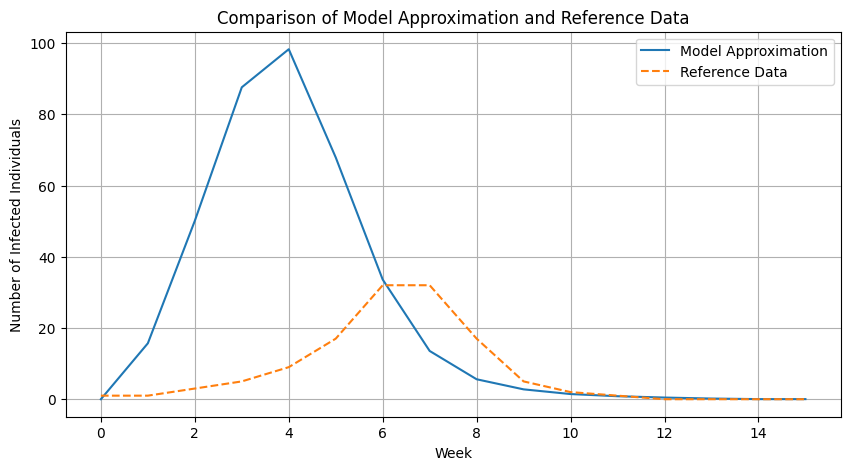

Moving to new local optima
Starting Parameters with k=8, beta=0.19999999999999998, ro=0.6


100%|██████████| 100/100 [00:24<00:00,  4.17it/s]

Best RMSE: 9.952847896456571 at beta=0.09999999999999998, k=8, ro=0.5


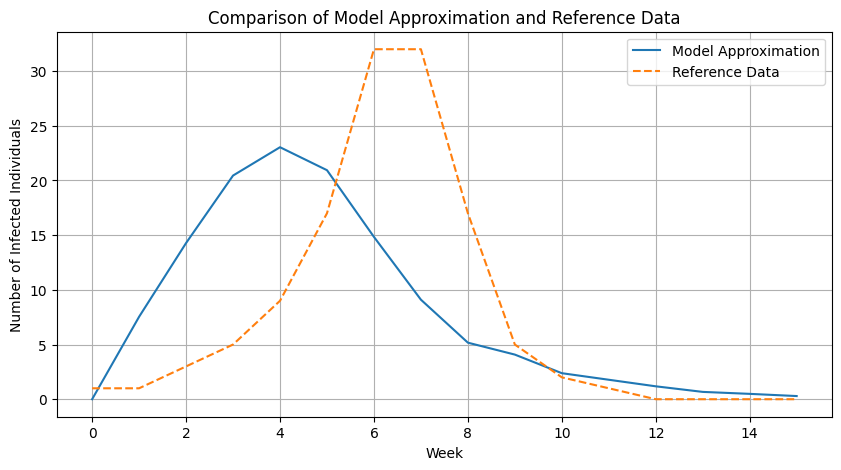

Moving to new local optima
Starting Parameters with k=8, beta=0.09999999999999998, ro=0.5


100%|██████████| 100/100 [00:28<00:00,  3.51it/s]


Moving to new local optima
Starting Parameters with k=8, beta=0.09999999999999998, ro=0.4


100%|██████████| 100/100 [00:27<00:00,  3.64it/s]

Best RMSE: 9.22296217329335 at beta=0.09999999999999998, k=6, ro=0.30000000000000004


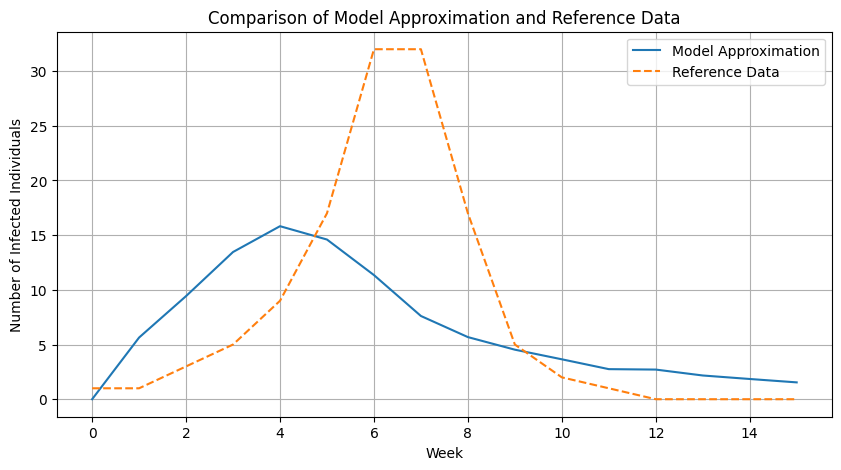

Moving to new local optima
Starting Parameters with k=6, beta=0.09999999999999998, ro=0.30000000000000004


100%|██████████| 100/100 [01:18<00:00,  1.27it/s]

Best RMSE: 9.190407363115087 at beta=0.09999999999999998, k=6, ro=0.20000000000000004


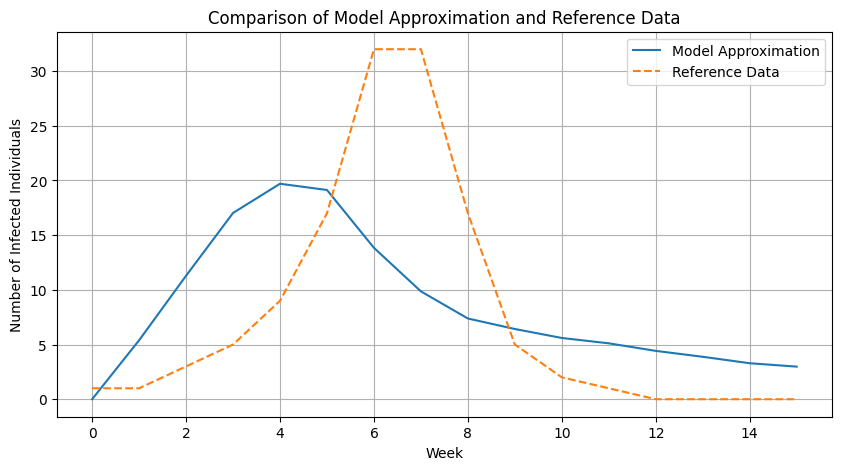

Moving to new local optima
Starting Parameters with k=6, beta=0.09999999999999998, ro=0.20000000000000004


100%|██████████| 100/100 [00:25<00:00,  3.93it/s]

Best RMSE: 8.920510075102209 at beta=0.09999999999999998, k=6, ro=0.20000000000000004


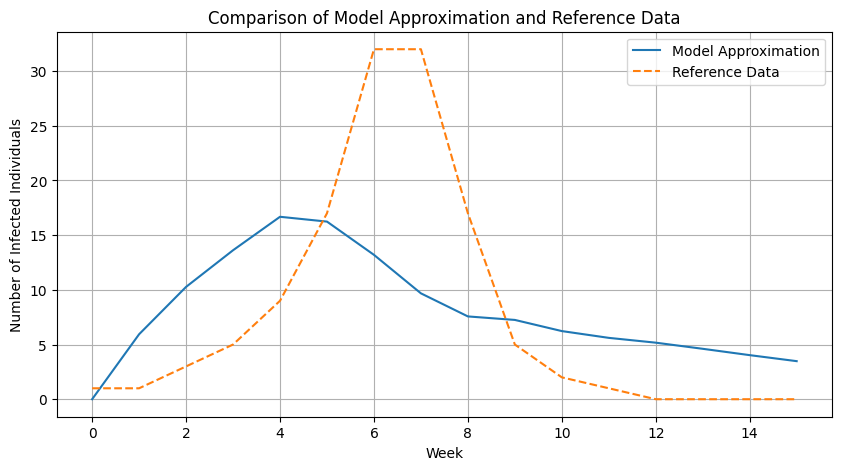

Updating precision
Starting Parameters with k=6, beta=0.09999999999999998, ro=0.20000000000000004


100%|██████████| 100/100 [00:28<00:00,  3.52it/s]

Best RMSE: 8.421384981106137 at beta=0.09999999999999998, k=7, ro=0.15000000000000002


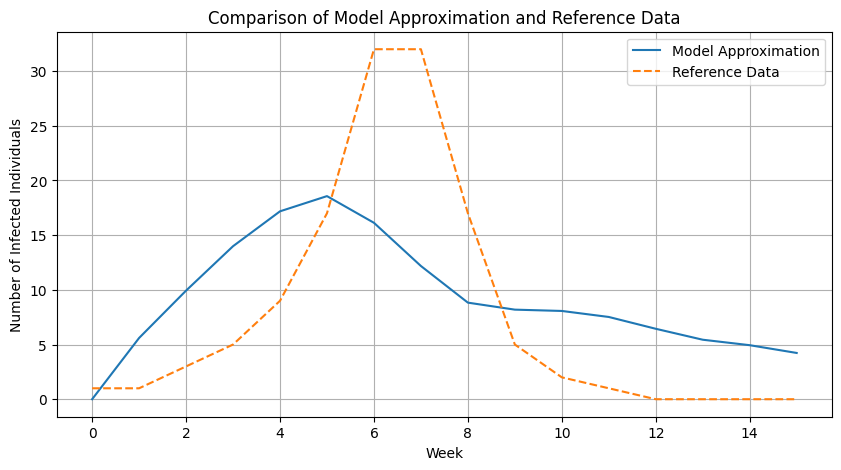

Moving to new local optima
Starting Parameters with k=7, beta=0.09999999999999998, ro=0.15000000000000002


100%|██████████| 100/100 [00:25<00:00,  3.89it/s]


Updating precision
Starting Parameters with k=7, beta=0.09999999999999998, ro=0.15000000000000002


100%|██████████| 100/100 [00:28<00:00,  3.49it/s]


Moving to new local optima
Starting Parameters with k=6, beta=0.09999999999999998, ro=0.2


100%|██████████| 100/100 [00:26<00:00,  3.78it/s]


Updating precision
Starting Parameters with k=6, beta=0.09999999999999998, ro=0.2


100%|██████████| 100/100 [00:28<00:00,  3.52it/s]


Moving to new local optima
Starting Parameters with k=7, beta=0.09999999999999998, ro=0.15000000000000002


100%|██████████| 100/100 [00:27<00:00,  3.66it/s]


Updating precision
Starting Parameters with k=7, beta=0.09999999999999998, ro=0.15000000000000002


100%|██████████| 100/100 [00:29<00:00,  3.37it/s]

Updating precision
Termination criteria met. Exiting optimization.
Optimized Parameters: beta:0.09999999999999998, k:7, ro0.15000000000000002, RMSE: 8.421384981106137


In [15]:
# Optimizing with specific parameters
# best_params, best_rmse = optimize_parameters()
best_rmse , beta, k, ro = parameters_optimization(initial_num_edges=10, initial_beta=0.3, initial_ro=0.6, delta_k=2, delta_beta=0.1, delta_ro=0.1)
print(f"Optimized Parameters: beta:{beta}, k:{k}, ro{ro}, RMSE: {best_rmse}")

# 2 Coloring

### >> Part a:

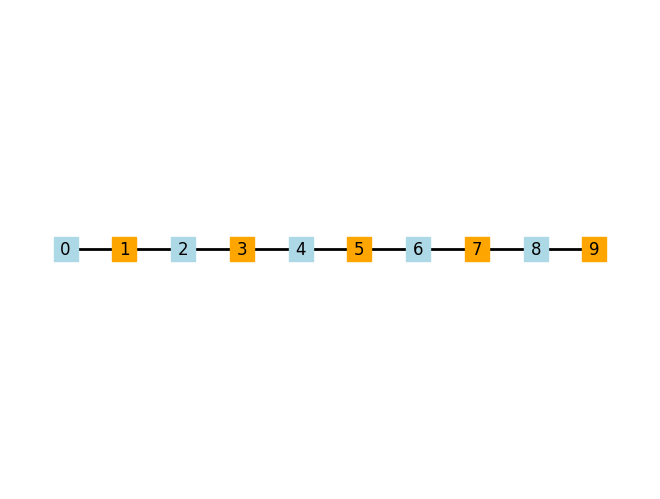

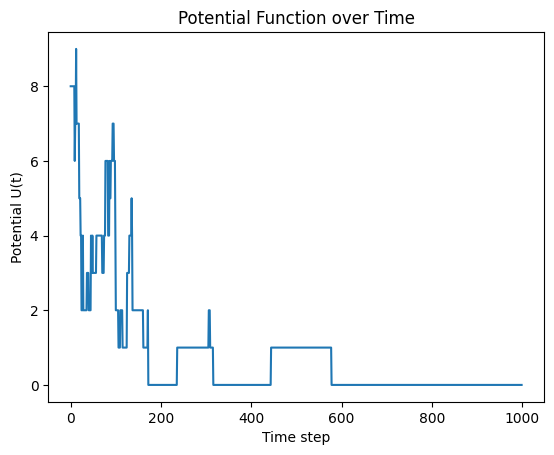

In [16]:
import networkx as nx
import matplotlib.pyplot as plt
import random

def eta(t):
    return t / 100.0

def cost(G, node, color):
    cost = 0
    for neighbor in G.neighbors(node):
        if G.nodes[neighbor]['color'] == color:
            cost += 1
    return cost

def update_probability(G, node, eta_t):
    current_color = G.nodes[node]['color']
    alternate_color = 'lightblue' if current_color == 'orange' else 'orange'
    current_cost = cost(G, node, current_color)
    alternate_cost = cost(G, node, alternate_color)
    
    probability_change = np.exp(-eta_t * alternate_cost) / (np.exp(-eta_t * current_cost) + np.exp(-eta_t * alternate_cost))
    return probability_change

def calculate_potential(G):
    potential = 0
    for node in G.nodes:
        for neighbor in G.neighbors(node):
            if G.nodes[node]['color'] == G.nodes[neighbor]['color']:
                potential += 1
    return potential / 2 

def simulate_coloring(G, iterations):
    potential_history = []  
    for t in range(iterations):
        node = random.choice(list(G.nodes()))
        eta_t = eta(t)
        prob_change = update_probability(G, node, eta_t)
        
        if random.random() < prob_change:
            G.nodes[node]['color'] = 'lightblue' if G.nodes[node]['color'] == 'orange' else 'orange'
            
        U_t = calculate_potential(G)
        potential_history.append(U_t)

    return potential_history

def initialize_graph():
    G = nx.Graph()
    num_nodes = 10
    for i in range(num_nodes):
        G.add_node(i, color='orange')
    for i in range(num_nodes-1):
        G.add_edge(i, i+1)
    return G

def visualize_graph(G):
    colors = [G.nodes[node]['color'] for node in G.nodes()]
    pos = {i: (i, 0) for i in range(len(G.nodes()))}  
    nx.draw(G, pos, with_labels=True, node_color=colors, node_shape='s', width=2.0)
    plt.show()

G = initialize_graph()
potential_history = simulate_coloring(G, 1000)  
visualize_graph(G)

plt.figure()
plt.plot(potential_history)
plt.xlabel('Time step')
plt.ylabel('Potential U(t)')
plt.title('Potential Function over Time')
plt.show()

### >> Part b:

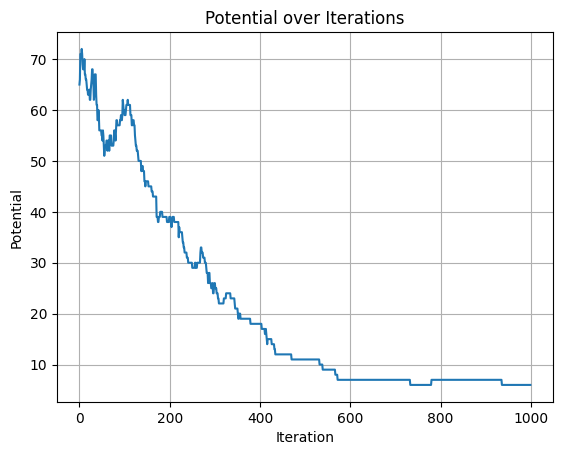

Minimum Potential: 6.0
Iteration at Minimum Potential: 733
Colors at Minimum Potential: [5 8 8 5 1 1 1 3 5 3 3 7 4 3 6 2 1 3 3 4 8 2 8 8 5 1 2 3 3 6 4 2 6 5 6 1 7
 3 1 2 1 8 3 3 8 7 5 2 6 4 5 4 2 1 1 1 6 3 1 1 8 5 3 5 1 7 8 1 5 3 6 3 3 3
 1 8 1 1 8 3 8 2 5 2 7 5 1 1 6 4 1 4 6 1 1 8 4 4 5 2]


In [18]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

mat_contents = scipy.io.loadmat('wifi.mat')
wifi = mat_contents['wifi']

mat_contents = scipy.io.loadmat('coords.mat')
coords = mat_contents['coords']

def cost(s, X_j):
    if X_j == s:
        return 2
    elif abs(X_j - s) == 1:
        return 1
    else:
        return 0

np.random.seed(0)  
num_routers = wifi.shape[0]

colors = np.random.choice([1, 2, 3, 4, 5, 6, 7, 8], size=num_routers)

def potential(wifi, colors):
    U = 0
    for i in range(num_routers):
        for j in range(num_routers):
            if wifi[i, j] == 1:
                U += cost(colors[i], colors[j])
    return U / 2  

def probability_change(eta_t, current_cost, alternate_cost):
    return np.exp(-eta_t * alternate_cost) / (np.exp(-eta_t * current_cost) + np.exp(-eta_t * alternate_cost))

def eta(t):
    return t / 100

def update_color(wifi, colors, t):
    i = np.random.randint(num_routers)  
    current_color = colors[i]
    current_cost = sum(cost(current_color, colors[j]) for j in range(num_routers) if wifi[i, j] == 1)
    alternate_colors = [c for c in range(1, 9) if c != current_color]
    for c in alternate_colors:
        alternate_cost = sum(cost(c, colors[j]) for j in range(num_routers) if wifi[i, j] == 1)
        if probability_change(eta(t), current_cost, alternate_cost) > np.random.random():
            colors[i] = c
            break
    return colors

U_values = []
iterations = 1000  
for t in range(1, iterations + 1):
    colors = update_color(wifi, colors, t)
    U_values.append(potential(wifi, colors))

plt.plot(U_values)
plt.xlabel('Iteration')
plt.ylabel('Potential')
plt.title('Potential over Iterations')
plt.grid(True)
plt.show()

min_potential = min(U_values)
min_potential_index = U_values.index(min_potential)
min_colors = colors

print(f"Minimum Potential: {min_potential}")
print(f"Iteration at Minimum Potential: {min_potential_index}")
print(f"Colors at Minimum Potential: {min_colors}")